* This notebook was made to compare salinity and current field with weakslip and normal for bathymetry6 and bathymetry10.

In [1]:
%matplotlib inline
from matplotlib import pylab
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
from salishsea_tools import viz_tools
from salishsea_tools import tidetools
import seaborn as sns
import os
sns.set_style('darkgrid')

In [2]:
grid =nc.Dataset(
        '/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc',
        'r')
Bathy = grid.variables['Bathymetry'][:, :]
X = grid.variables['nav_lon'][:, :]
Y = grid.variables['nav_lat'][:, :]

# Comparison for bathymetry6

In [3]:
runs=['junevis1e-5','juneshlat0.2']
base='/data/jieliu/MEOPAR/parameters/'
sals={}; depths={}; Us={}; Vs={}
grid = nc.Dataset('/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc')
bathy=grid.variables['Bathymetry']
for run in runs:
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_T.nc'.format(run))
    f = nc.Dataset(path,'r');
    sals[run]=f.variables['vosaline']
    depths[run] = f.variables['deptht'] 
    T_lat = f.variables['nav_lat']
    T_lon = f.variables['nav_lon']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_U.nc'.format(run))
    f = nc.Dataset(path,'r');
    Us[run]=f.variables['vozocrtx']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_V.nc'.format(run))
    f = nc.Dataset(path,'r');
    Vs[run]=f.variables['vomecrty']

In [4]:
def quiver_salinity(t,dep,imin=1,imax=396,jmin=1,jmax=896,st=5,cmin= -4, cmax=4, dels = 0.4):
    "compare rivers and salinity at t, dep in box. st is quiver arrow interval"
    fig,axs = plt.subplots(1,3,figsize=(36,15))
    x=np.arange(imin,imax)
    y=np.arange(jmin,jmax)
    U={}; V={};u={};v={};uE={};vN={};
    for key, ax in zip(runs,axs[:-1]):
        #truncate U/V and unstagger
        U[key]= Us[key][t,dep,jmin-1:jmax,imin-1:imax]
        V[key] =Vs[key][t,dep,jmin-1:jmax,imin-1:imax]
        lon=T_lon[jmin:jmax,imin:imax]
        lat=T_lat[jmin:jmax,imin:imax]
        S=sals[key][t,dep,jmin:jmax,imin:imax]
        S = np.ma.masked_values(S, 0)
        #masking
        U[key] = np.ma.masked_values(U[key],0)
        V[key] = np.ma.masked_values(V[key],0)
        #unstagger
        u[key],v[key] = viz_tools.unstagger(U[key],V[key])
        #rotate
        theta = np.pi*29/180
        uE[key] = u[key]*np.cos(theta) - v[key]*np.sin(theta)
        vN[key] = u[key]*np.sin(theta) +v[key]*np.cos(theta)
        #mesh
        mesh=ax.pcolormesh(lon,lat,S,cmap='spectral')
        viz_tools.plot_land_mask(ax,grid,coords='map',color='burlywood')
        #quivers
        quiver = ax.quiver(lon[::st,::st],lat[::st,::st],uE[key][::st,::st], vN[key][::st,::st],
                       pivot='mid', scale = 5, color='white',width=0.005
                       )
        ax.quiverkey(quiver,-123.9,49., 1,'1 m/s',coordinates='data', color='black', labelcolor='black',\
                    fontproperties = {'size': '15'})
        cbar = plt.colorbar(mesh,ax=ax)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', fontsize = 20)
        cbar.set_label('Practical Salinity',fontsize = 20)
        ax.plot((-123.1,-123.8),(49,49.2),'k-')
        ax.set_xlim([-124.,-123])
        ax.set_ylim([48.9,49.4])
        plt.setp(ax.get_xticklabels(), fontsize=20)
        plt.setp(ax.get_yticklabels(), fontsize=20)
        ax.set_title(key, fontsize = 20)       
    ##plot difference
    ax = axs[-1]
    sal_diff = sals[runs[0]][t,dep,jmin:jmax,imin:imax] - sals[runs[1]][t,dep,jmin:jmax,imin:imax]
    U_diff = uE[runs[0]] - uE[runs[1]]
    V_diff = vN[runs[0]] - vN[runs[1]]
    mesh=ax.pcolormesh(lon,lat,sal_diff,cmap='RdBu_r',vmin=cmin, vmax=cmax)
    quiver = ax.quiver(lon[::st,::st], lat[::st,::st],U_diff[ ::st, ::st], V_diff[::st,::st],\
                           pivot='mid',scale=5, width=0.005, color='black' )
    ax.quiverkey(quiver,-123.9,49., 1, '1 m/s',
                        coordinates='data', color='black', labelcolor='black',
                    fontproperties = {'size': '15'})
    viz_tools.plot_land_mask(ax,grid,coords='map',xslice=x,yslice=y,color='burlywood')
    cbar = plt.colorbar(mesh, ax=ax)
    plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', fontsize = 20)
    cbar.set_label(' Salinity difference',fontsize = 20)
    ax.plot((-123.1,-123.8),(49,49.2),'k-')
    plt.setp(ax.get_xticklabels(), fontsize=20)
    plt.setp(ax.get_yticklabels(), fontsize=20)
    ax.set_title('rn_shlat difference between 0.5 & 0.2',\
                     fontsize = 20)
    ax.set_xlim([-124.,-123])
    ax.set_ylim([48.9,49.4])
    return fig  

In [5]:
def salinity_transect_plot(t,dep):
    slats = np.linspace(49, 49.2, num=30, endpoint=True)
    slons = np.linspace(-123.1,-123.8, num=30, endpoint=True)
    ylat = np.zeros((30), dtype=np.int64)
    xlon = np.zeros((30), dtype=np.int64)
    for i, lat in enumerate(slats):
        lon = slons[i]
        ylat[i], xlon[i] = tidetools.find_closest_model_point(lon, lat, X, Y, Bathy, lat_tol=0.003)
    sals_0 = np.ma.masked_values(sals[runs[0]][t,dep], 0)
    sals_1 = np.ma.masked_values(sals[runs[1]][t,dep], 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.plot(slons, sals_0[ ylat, xlon], 'b*-',label = 'normal');
    ax.plot(slons, sals_1[ ylat, xlon], 'go-',label = 'weakslip');
    ax.legend(loc ='best', fontsize = 15)
    ax.set_xlim((-124,-123))
    ax.set_ylim((10,26))
    return fig

#  Surface layer

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


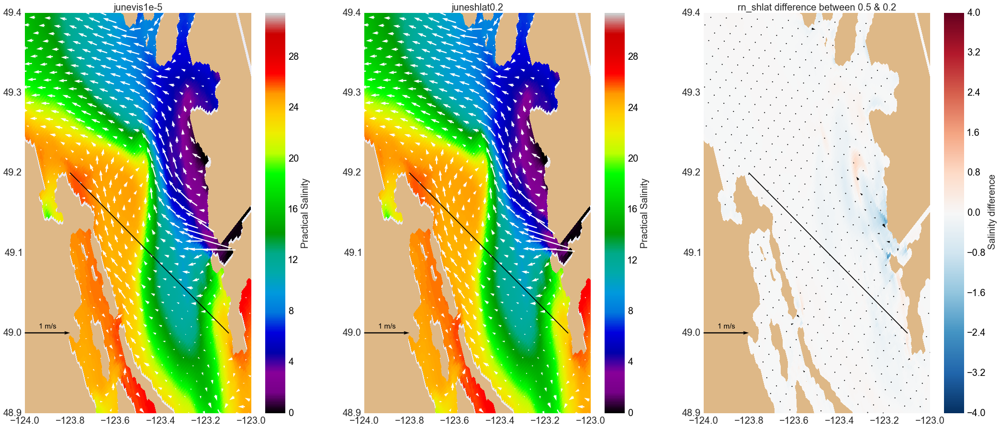

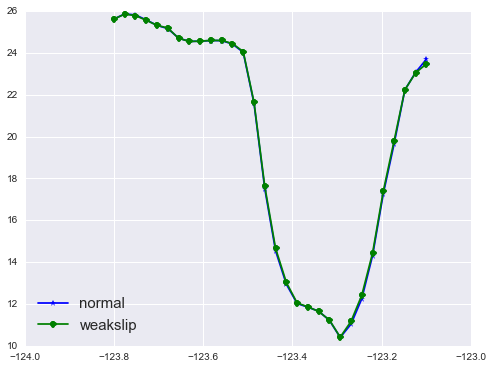

In [6]:
## start day & surface currents
t=0; dep=0
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


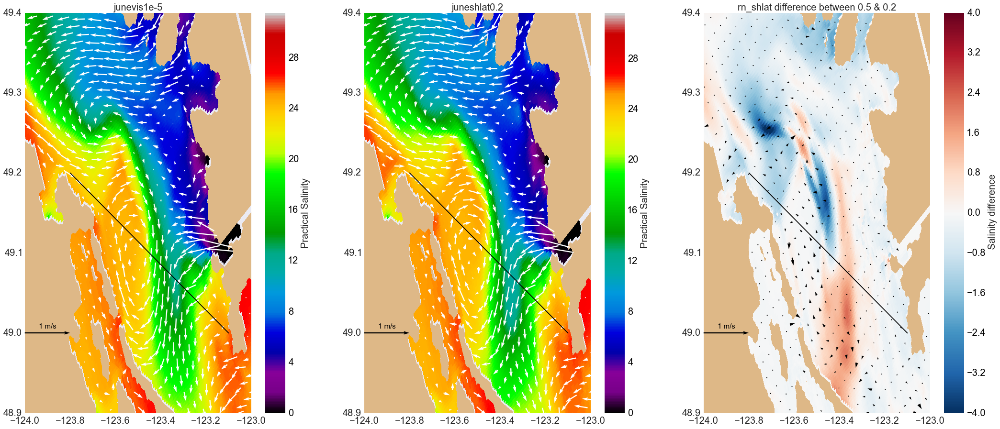

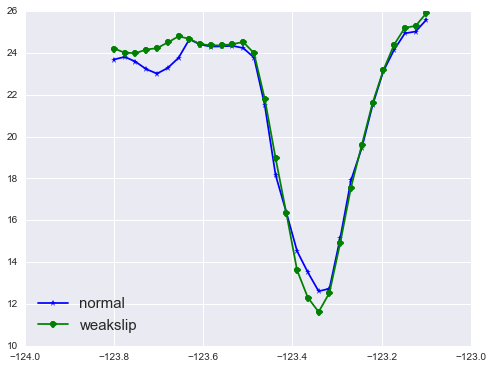

In [7]:
## middle of this period & surface currents
t=14; dep=0
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


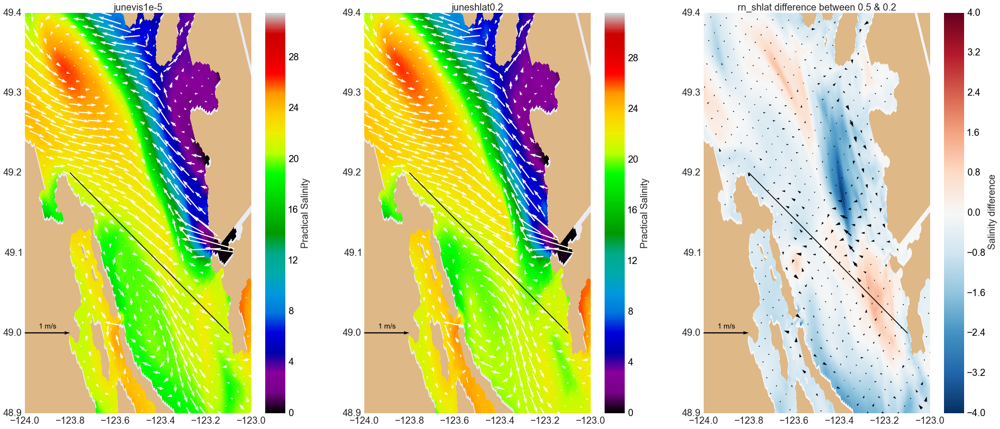

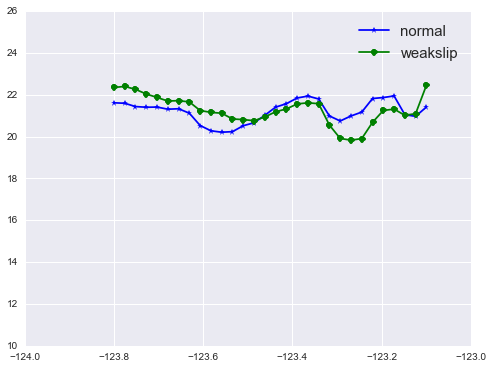

In [8]:
## end of this period & surface currents
t=29; dep=0
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

# 1.5m 

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


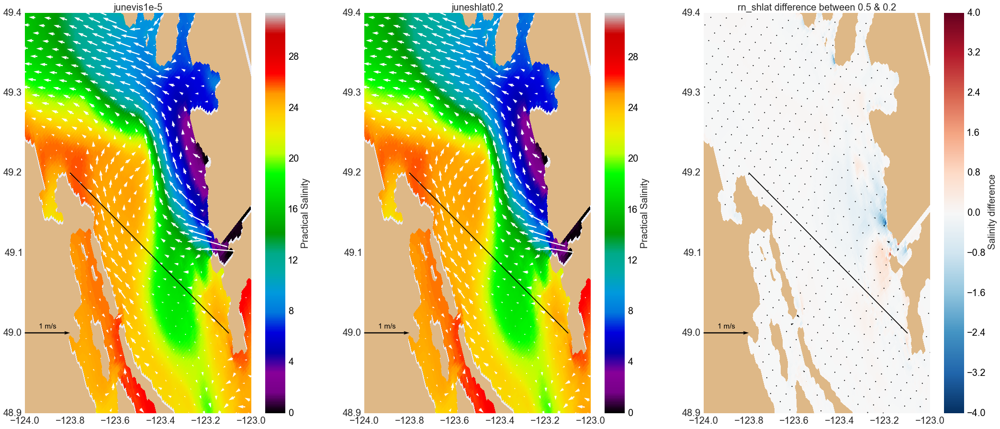

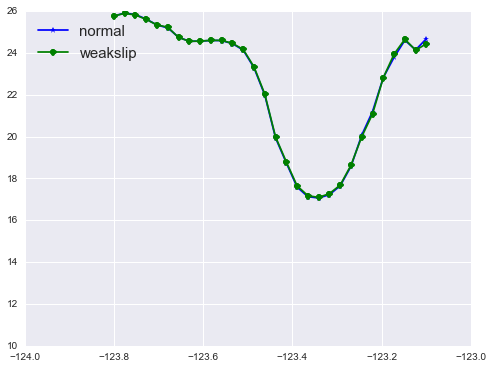

In [9]:
## start day & 1.5m 
t=0; dep=1
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


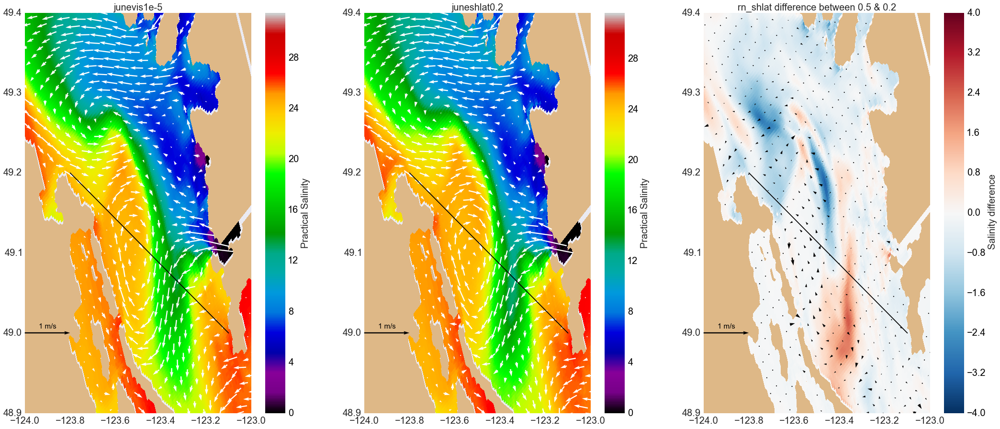

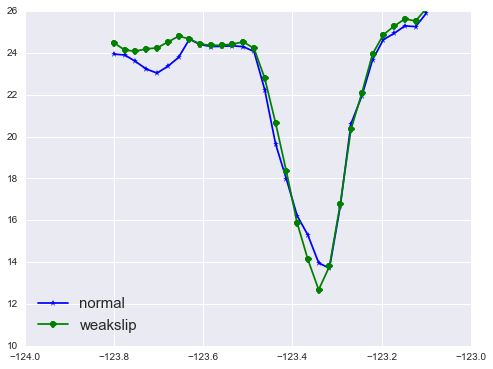

In [10]:
t=14; dep=1
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


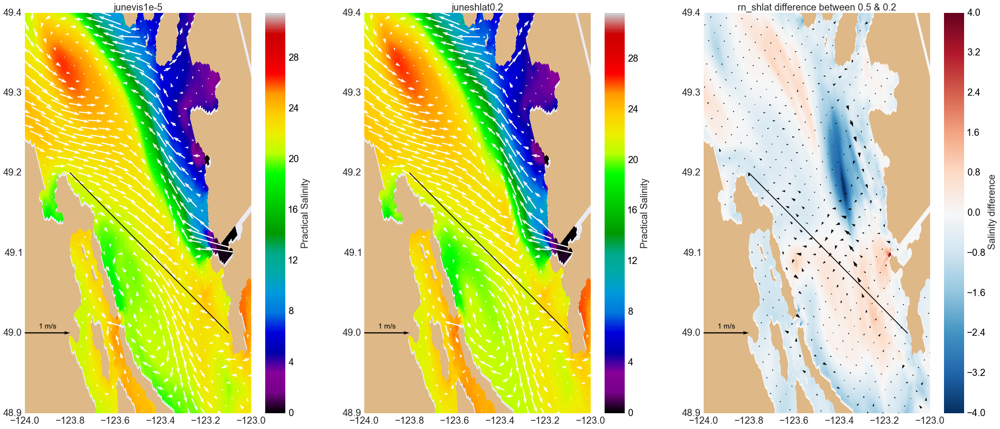

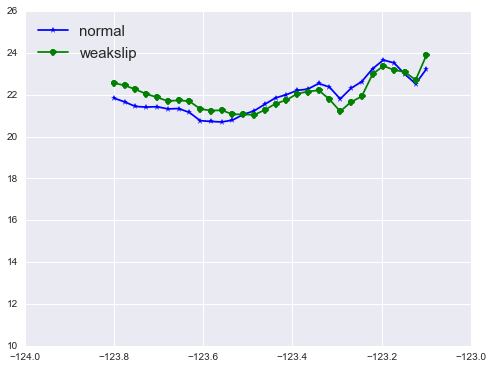

In [11]:
t=29; dep=1
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

# Cross-strait velocity magnitude

In [12]:
def magnitude_plot(t,dep,imin=1,imax=396,jmin=1,jmax=896,st=5,cmin1= -1., cmax1=1.,\
                   cmin2= -.6, cmax2=.6, dels = 0.1):
    "compare rivers and salinity at t, dep in box. st is quiver arrow interval"
    fig,axs = plt.subplots(1,3,figsize=(36,15))
    x=np.arange(imin,imax)
    y=np.arange(jmin,jmax)
    U={}; V={};u={};v={};uE={};vN={};
    for key, ax in zip(runs,axs[:-1]):
        #truncate U/V and unstagger
        U[key]= Us[key][t,dep,jmin-1:jmax,imin-1:imax]
        V[key] =Vs[key][t,dep,jmin-1:jmax,imin-1:imax]
        lon=T_lon[jmin:jmax,imin:imax]
        lat=T_lat[jmin:jmax,imin:imax]
        #masking
        U[key] = np.ma.masked_values(U[key],0)
        V[key] = np.ma.masked_values(V[key],0)
        #unstagger
        u[key],v[key] = viz_tools.unstagger(U[key],V[key])
        #rotate
        theta = np.pi*29/180
        uE[key] = u[key]*np.cos(theta) - v[key]*np.sin(theta)
        vN[key] = u[key]*np.sin(theta) +v[key]*np.cos(theta)
        #mesh
        mesh=ax.pcolormesh(lon,lat,uE[key],cmap='RdBu_r',vmin=cmin1, vmax=cmax1)
        viz_tools.plot_land_mask(ax,grid,coords='map',color='burlywood')
        #quivers
        quiver = ax.quiver(lon[::st,::st],lat[::st,::st],uE[key][::st,::st], vN[key][::st,::st],
                       pivot='mid', scale = 5, color='white',width=0.005)
        ax.quiverkey(quiver,-123.9,49., 1,'1 m/s',coordinates='data', color='black', labelcolor='black',\
                    fontproperties = {'size': '15'})
        cbar = plt.colorbar(mesh,ax=ax)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', fontsize = 20)
        cbar.set_label('U velocity',fontsize = 20)
        ax.set_xlim([-124.,-123])
        ax.set_ylim([48.9,49.4])
        plt.setp(ax.get_xticklabels(), fontsize=20)
        plt.setp(ax.get_yticklabels(), fontsize=20)
        ax.set_title(key, fontsize = 20)       
    ##plot difference
    ax = axs[-1]
    U_diff = uE[runs[0]] - uE[runs[1]]
    V_diff = vN[runs[0]] - vN[runs[1]]
    mesh=ax.pcolormesh(lon,lat,U_diff,cmap='RdBu_r',vmin=cmin2, vmax=cmax2)
    quiver = ax.quiver(lon[::st,::st], lat[::st,::st],U_diff[ ::st, ::st], V_diff[::st,::st],\
                           pivot='mid',scale=5, width=0.005, color='black' )
    ax.quiverkey(quiver,-123.9,49., 1, '1 m/s',coordinates='data', color='black', labelcolor='black',
                    fontproperties = {'size': '15'})
    viz_tools.plot_land_mask(ax,grid,coords='map',xslice=x,yslice=y,color='burlywood')
    cbar = plt.colorbar(mesh, ax=ax)
    plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', fontsize = 20)
    cbar.set_label(' U velocity difference',fontsize = 20)
    plt.setp(ax.get_xticklabels(), fontsize=20)
    plt.setp(ax.get_yticklabels(), fontsize=20)
    ax.set_title('rn_shlat difference between 0.5 & 0.2',fontsize = 18)
    ax.set_xlim([-124.,-123])
    ax.set_ylim([48.9,49.4])
    return fig  

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


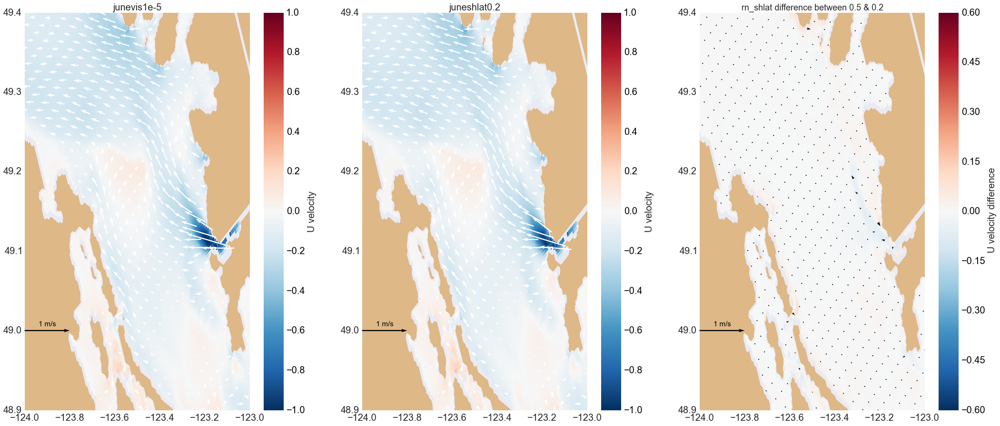

In [13]:
t=0;dep=0;
fig = magnitude_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


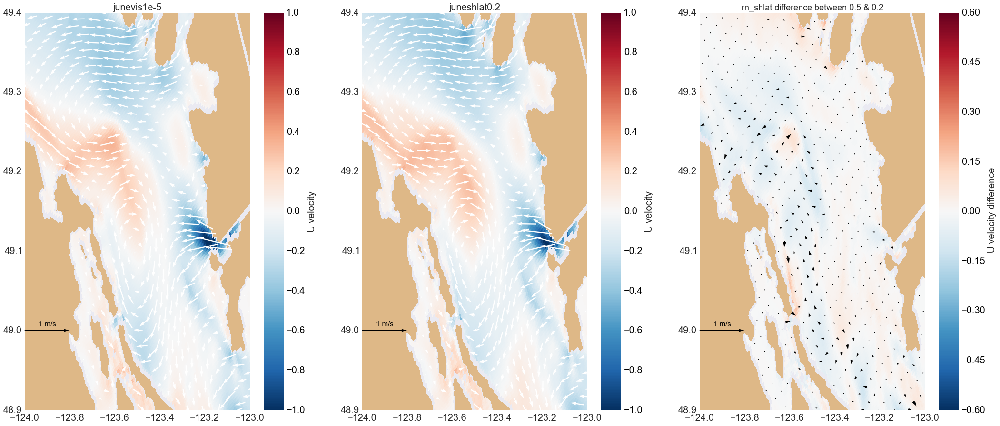

In [14]:
t=14;dep=0;
fig = magnitude_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


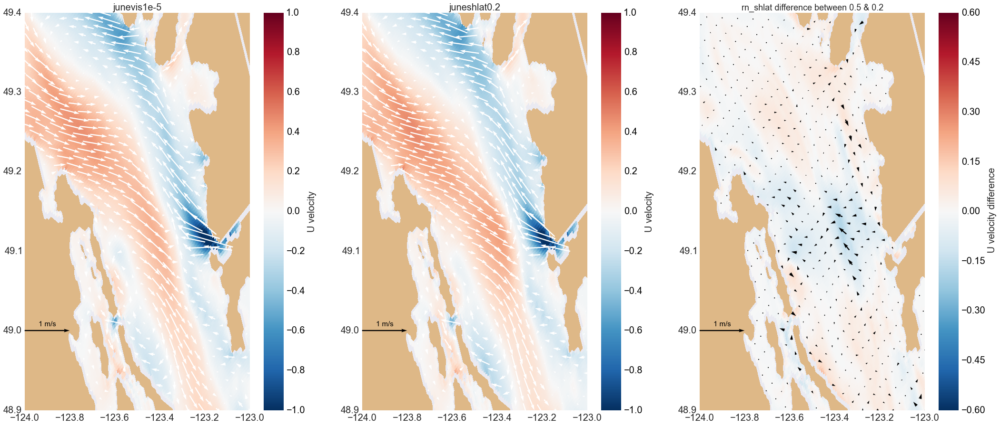

In [15]:
t=29;dep=0;
fig = magnitude_plot(t,dep)

# 1.5m

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


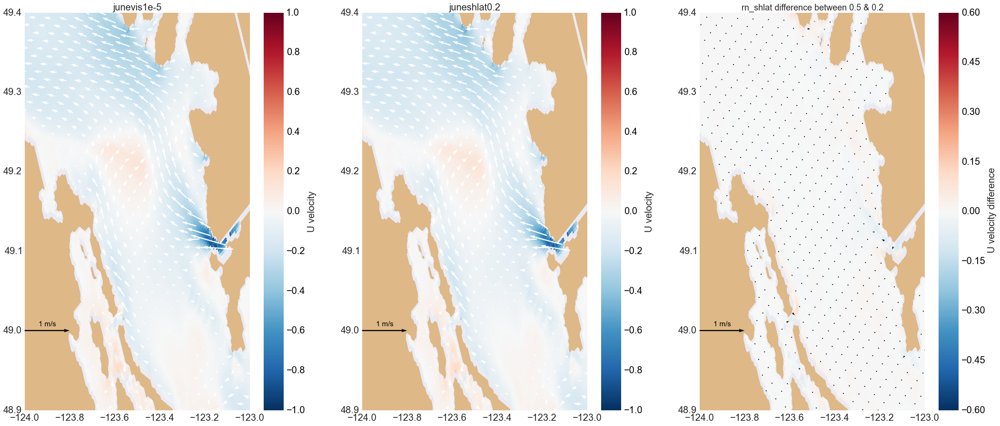

In [16]:
t=0;dep=1;
fig = magnitude_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


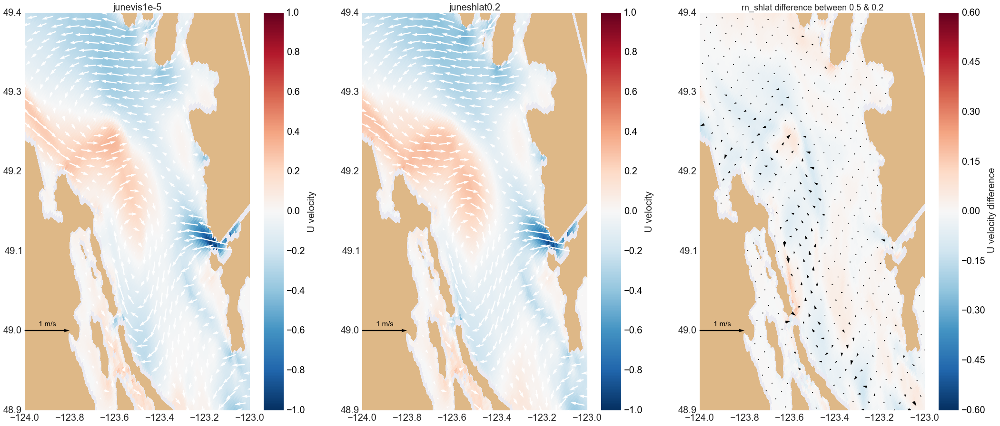

In [17]:
t=14;dep=1;
fig = magnitude_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


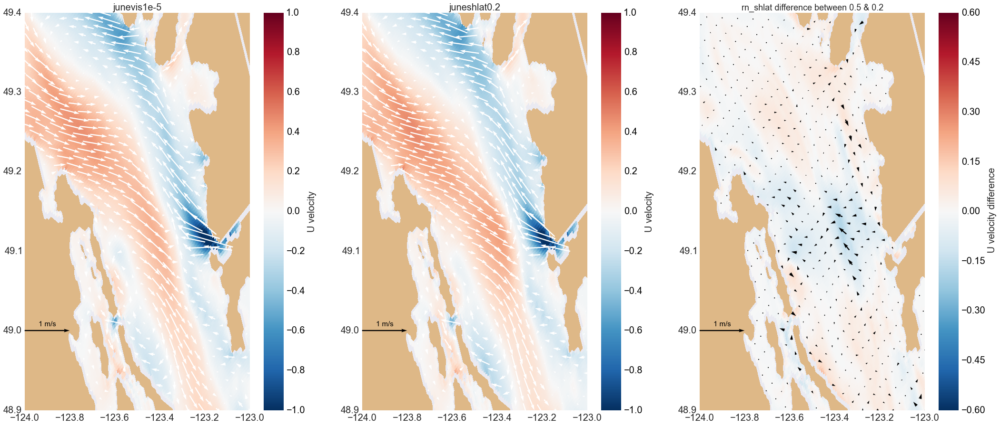

In [18]:
t=29;dep=0;
fig = magnitude_plot(t,dep)

# Comparison for bathymetry10(jetty)

In [19]:
runs=['junejettyvis1e05','junejettyshlat0.2']
base='/data/jieliu/MEOPAR/parameters/'
sals={}; depths={}; Us={}; Vs={}
grid = nc.Dataset('/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc')
bathy=grid.variables['Bathymetry']
for run in runs:
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_T.nc'.format(run))
    f = nc.Dataset(path,'r');
    sals[run]=f.variables['vosaline']
    depths[run] = f.variables['deptht'] 
    T_lat = f.variables['nav_lat']
    T_lon = f.variables['nav_lon']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_U.nc'.format(run))
    f = nc.Dataset(path,'r');
    Us[run]=f.variables['vozocrtx']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_V.nc'.format(run))
    f = nc.Dataset(path,'r');
    Vs[run]=f.variables['vomecrty']

# Surface layer

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


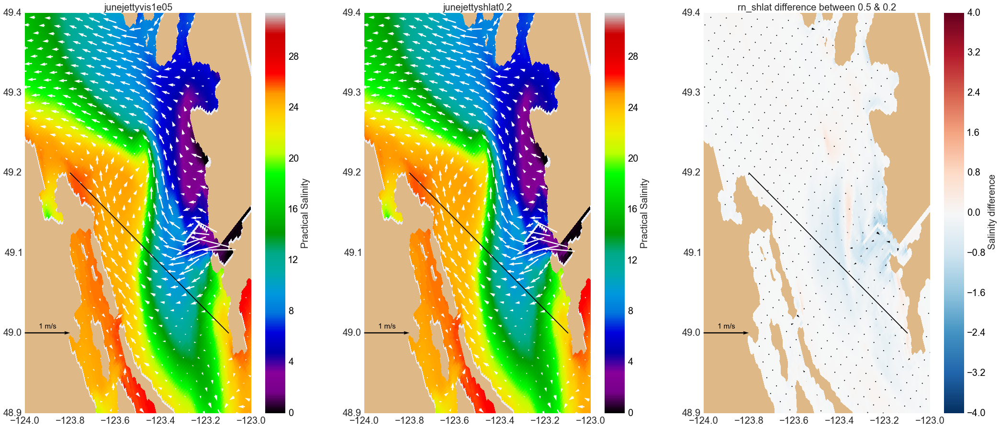

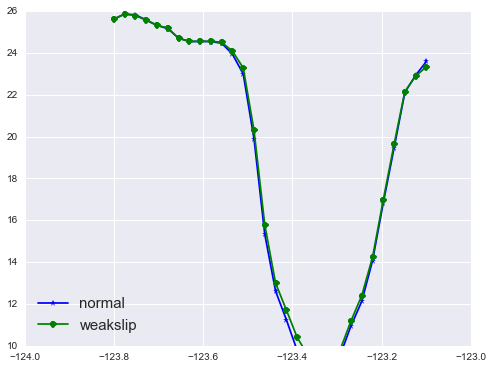

In [20]:
## start day & surface currents
t=0; dep=0
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


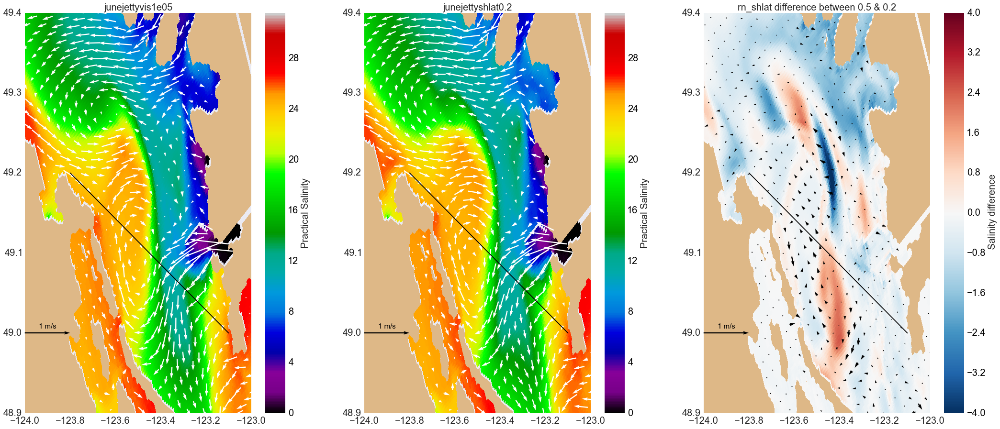

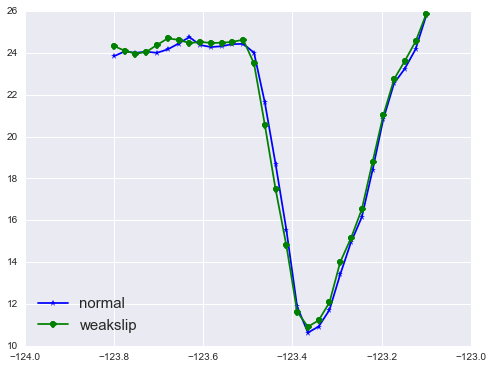

In [21]:
t=14; dep=0
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


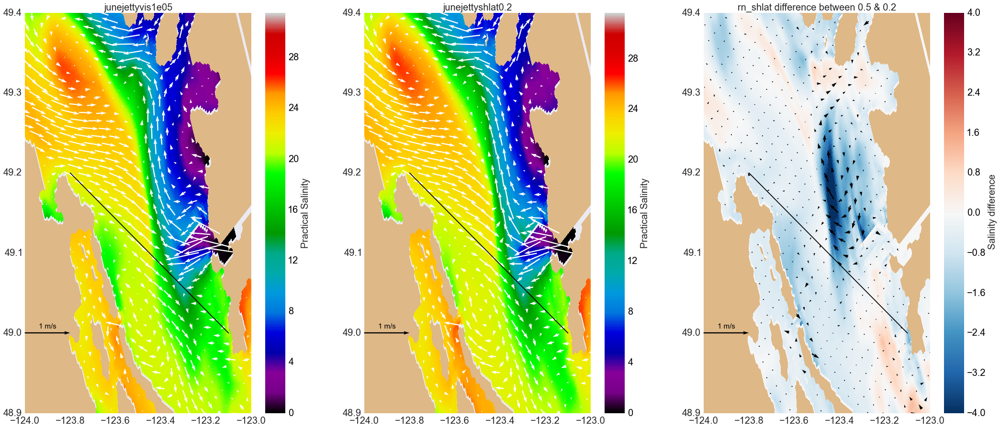

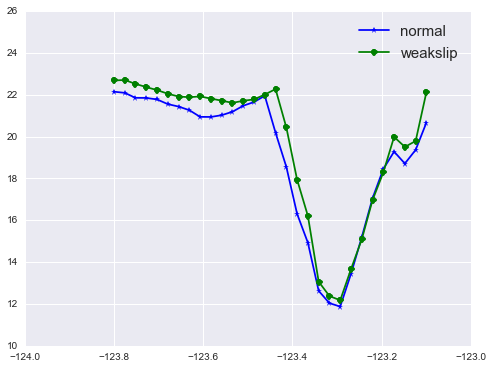

In [22]:
t=29; dep=0
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

# 1.5m

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


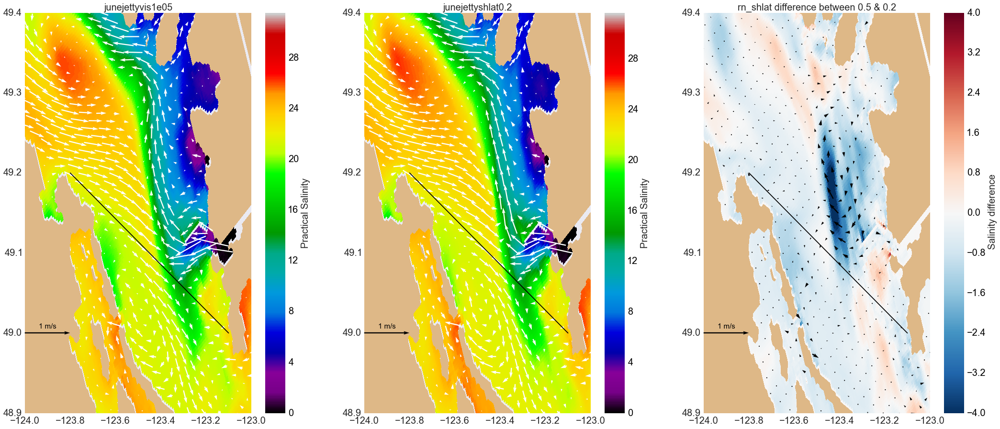

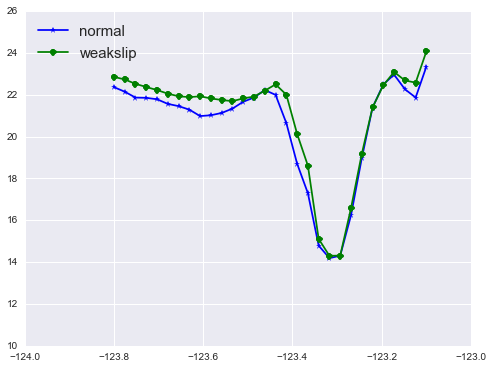

In [23]:
t=29; dep=1
fig=quiver_salinity(t,dep)
fig = salinity_transect_plot(t,dep)

# Cross-strait velocity

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


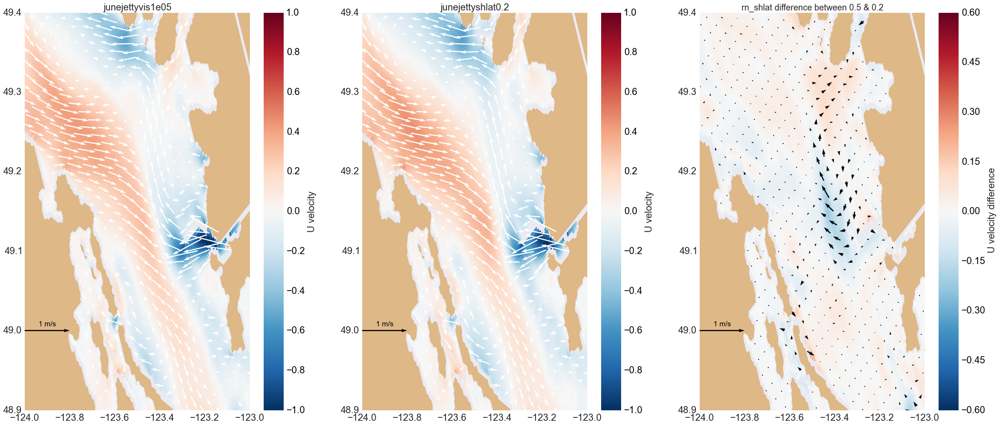

In [24]:
t=29;dep=0;
fig = magnitude_plot(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


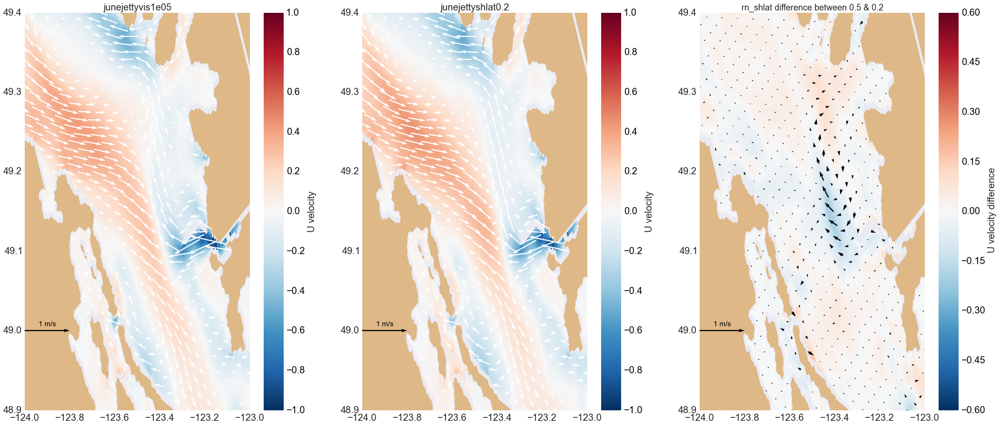

In [25]:
t=29;dep=1;
fig = magnitude_plot(t,dep)